In [1]:
#!/bin/env python

from __future__ import absolute_import, division, print_function, unicode_literals

import sys,os,os.path,time
sys.path.append(os.path.expanduser('/global/u1/r/rgupta2/.local/lib/python3.7/site-packages/'))

# export PYTHONPATH="${PYTHONPATH}:/usr/local/lib/python2.7/site-packages:/usr/lib/python2.7/site-packages"


# import matplotlib.style
# import matplotlib as mpl
# mpl.use('Agg')
# # mpl.style.use('seaborn')
# mpl.rc('image', cmap='gray')

import matplotlib.pyplot as plt
	
%matplotlib inline
plt.rcParams['figure.figsize'] = (8,10)


import time, re, sys, os
from tqdm import tqdm, trange

import pandas as pd
import xarray as xr
from glob import glob
import numpy as np
from scipy import stats
# Install a pip package in the current Jupyter kernel
# !{sys.executable} -m pip install --user Pillow

from PIL import Image
from random import seed
from random import randint

import tensorflow as tf


In [2]:
print(tf.__version__)

1.15.0


In [3]:
checkpoint_dir = "/global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/precipitation_normalized_training_with_logan_feature_matching_fixed_offset_192_resolution_128_correct_chi/checkpoint"
counter = 0

model_dir = "Climate-StyleGAN_climate_stylegan2900_128to128"



checkpoint_dir = os.path.join(checkpoint_dir, model_dir)

print(" [*] Reading checkpoints from {} with counter {} ".format(checkpoint_dir, counter))
states = tf.train.get_checkpoint_state(checkpoint_dir)

print(type(states))

if(counter == 0):
    if (states and states.model_checkpoint_path):
        checkpoint_paths = states.all_model_checkpoint_paths
        load_model_path = checkpoint_paths[-1]  
        counter = int(load_model_path.split('-')[-1])
        print(" [*] Success to read {} with counter {} ".format(load_model_path, counter))
      
    else:
        print(" [*] Failed to find a checkpoint")
        counter = -1
else:
    specific_checkpoint_name = "/Climate-StyleGAN.model-{}".format(counter)
    load_model_path =  checkpoint_dir + specific_checkpoint_name
    # self.saver.restore(self.sess, load_model_path)
    print(" [*] Success to read {}".format(load_model_path))





# tf.train.latest_checkpoint
# with tf.Session() as sess:
#     new_saver = tf.train.import_meta_graph('my_test_model-1000.meta')
#     new_saver.restore(sess, tf.train.latest_checkpoint('./'))

 [*] Reading checkpoints from /global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/precipitation_normalized_training_with_logan_feature_matching_fixed_offset_192_resolution_128_correct_chi/checkpoint/Climate-StyleGAN_climate_stylegan2900_128to128 with counter 0 
<class 'tensorflow.python.training.checkpoint_state_pb2.CheckpointState'>
 [*] Success to read /global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/precipitation_normalized_training_with_logan_feature_matching_fixed_offset_192_resolution_128_correct_chi/checkpoint/Climate-StyleGAN_climate_stylegan2900_128to128/Climate-StyleGAN.model-78750 with counter 78750 


In [4]:
sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True))
graph = tf.get_default_graph()
with graph.as_default():
    with sess.as_default():
        #restoring the model
        loader = tf.train.import_meta_graph(load_model_path + '.meta')
        loader.restore(sess, load_model_path)
#         initializing all variables
        sess.run(tf.global_variables_initializer())


    


#         op_to_restore = graph.get_tensor_by_name("generator/g_synthesis/128x128_1/ToRGB/add")

#         batch_size = 1
#         z_dim = 512

#         seed = np.random.randint(low=0, high=10000)
#         test_z = np.random.RandomState(seed).normal(size=[batch_size, z_dim])

        
#         feed_dict={x_tensor: x_test,  keep_prob: 1.0}
#         opt = []
#         opt = sess.run(op_to_restore ,feed_dict)

        
#         image_frame_dim = int(np.floor(np.sqrt(self.batch_size)))
#         generated_image = []
#         saved_seeds = []


#         print("-----> self batch size {} \n self. z dim {}\n".format(batch_size, z_dim))
#         Data = {}
#         for i in tqdm(range(50)):


#             seed = np.random.randint(low=0, high=10000)
#             test_z = tf.cast(np.random.RandomState(seed).normal(size=[batch_size, z_dim]), tf.float32)
#             alpha = tf.constant(0.0, dtype=tf.float32, shape=[])
#             self.fake_images = self.generator(test_z, alpha=alpha, target_img_size=self.img_size, is_training=False)
#             samples = self.sess.run(self.fake_images)
#             generated_image.append(samples)
#             saved_seeds.append(seed)



    
    
#         using the model for prediction
#         x_tensor = graph.get_tensor_by_name("inputTensor:0")
#         #keep_prob is not always necessary it depends on your model
#         keep_prob = graph.get_tensor_by_name("dropout_keep_prob:0")
#         op_to_restore = graph.get_tensor_by_name("output/softmax:0")
#         feed_dict={x_tensor: x_test,  keep_prob: 1.0}
        
#         opt = []
        
#         opt = sess.run(op_to_restore ,feed_dict)
        
#         y_test = np.asarray(y_test)# converting list to numpy array
#         labels=np.argmax(y_test, 1)
#         predictions=np.argmax(opt,1)
#         count =  np.sum(labels == predictions)
#         print("Number of correct prediction %d out of %d"%(count,len(predictions)))
#         print("Accuracy is {:.3f}". format(float(count)/len(predictions)))

# loaded_graph = tf.Graph()
# with tf.Session(graph=loaded_graph) as sess:
#     # Restore from checkpoint
#     loader = tf.train.import_meta_graph(load_model_path + '.meta')
#     loader.restore(sess, load_model_path)    
#     # Export checkpoint to SavedModel
#     builder = tf.saved_model.builder.SavedModelBuilder(export_dir)
#     builder.add_meta_graph_and_variables(sess,
#                                          [tf.saved_model.tag_constants.TRAINING, tf.saved_model.tag_constants.SERVING],
#                                          strip_default_attrs=True)
    
    
    

# '''
# Load trained model.
# '''

# print('Loading model...')
# loaded_graph = tf.Graph()
# sess = tf.InteractiveSession(graph = loaded_graph)

# with tf.gfile.GFile(load_model_path, 'rb') as f:
#     graph_def = tf.GraphDef()
#     graph_def.ParseFromString(f.read())
    


INFO:tensorflow:Restoring parameters from /global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/precipitation_normalized_training_with_logan_feature_matching_fixed_offset_192_resolution_128_correct_chi/checkpoint/Climate-StyleGAN_climate_stylegan2900_128to128/Climate-StyleGAN.model-78750


In [5]:

tensors_per_node = [node.values() for node in graph.get_operations()]
tensor_names = [tensor.name for tensors in tensors_per_node for tensor in tensors]

In [34]:
x1 = np.arange(12).reshape((3, 4))
x2 = np.arange(3.0)
print(x1.shape)
print(x2.shape)
np.multiply(x1, x2)

(3, 4)
(3,)


ValueError: operands could not be broadcast together with shapes (3,4) (3,) 

In [35]:
    
seed = 42
inp_tensor = graph.get_tensor_by_name('random_normal:0')
op_to_restore = graph.get_tensor_by_name('generator/g_synthesis/128x128_1/ToRGB/add:0')
    
batch_size = 4
z_dim = 512






def slurp(theta, u, z0, z1):
    val1 = np.multiply((np.sin((1-u)*theta)/np.sin(theta))[:, None], z0)  
    val2 = np.multiply((np.sin(u*theta)/np.sin(theta))[:, None] , z1)
    return val1 + val2
z_0 = np.random.normal(size=[batch_size, z_dim])
z_1 = np.random.normal(size=[batch_size, z_dim])
# alpha = tf.constant(0.0, dtype=tf.float32, shape=[])

# z_0 = dcgan.z_gen(shape=(dcgan.batch_size, dcgan.z_dim))
# z_1 = dcgan.z_gen(shape=(dcgan.batch_size, dcgan.z_dim))

z_0_norm = np.sqrt(np.einsum('ij,ij->i', z_0, z_0))
z_1_norm = np.sqrt(np.einsum('ij,ij->i', z_1, z_1))
theta = np.arccos(np.einsum('ij,ij->i', z_0, z_1)/ (z_0_norm* z_1_norm))
samples = []
for u in np.arange(0,1.2,0.2):
    input_z = slurp(theta, u, z_0, z_1)
    feed_dict={inp_tensor : input_z}
    opt = sess.run(op_to_restore ,feed_dict)
    samples.append(opt)






print(len(samples))

(4, 512)
(4, 512)
(4, 512)
(4, 512)
(4, 512)
(4, 512)
6


(4, 128, 128, 1)


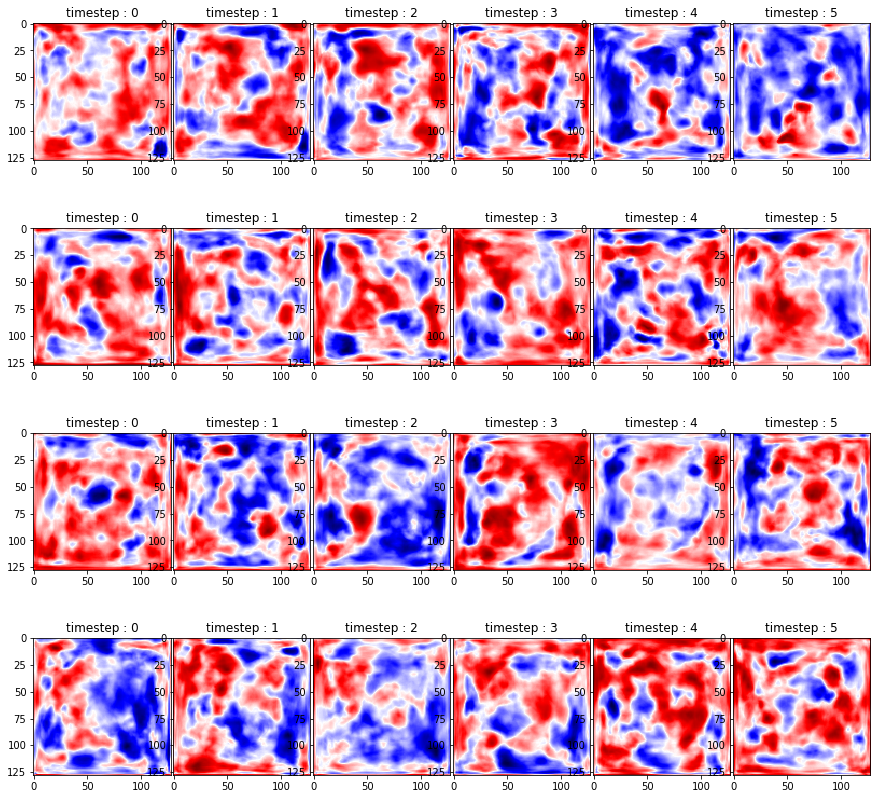

In [40]:
print(samples[0].shape)


fig, axs = plt.subplots(samples[0].shape[0], len(samples), figsize=(15,15))
fig.subplots_adjust(hspace=0.02, wspace=0.02)
for i in range(samples[0].shape[0]):
    for j in range(len(samples)):
        axs[i,j].imshow(samples[j][i,:,:,0], cmap='seismic');
        axs[i,j].set_title('timestep : {}'.format(j))
        
        
# axs[0, 0].plot(x, y)
# axs[0, 0].set_title('Axis [0,0]')
# axs[0, 1].plot(x, y, 'tab:orange')
# axs[0, 1].set_title('Axis [0,1]')
# axs[1, 0].plot(x, -y, 'tab:green')
# axs[1, 0].set_title('Axis [1,0]')
# axs[1, 1].plot(x, -y, 'tab:red')
# axs[1, 1].set_title('Axis [1,1]')

# fig, (ax1, ax2) = plt.subplots(2, figsize=(10,8))
# fig.suptitle('norm_transform_precipitation_PDE')
# ax1.hist([prec_data.flatten()], color=[ 'r'], bins=100, linewidth=2 ,histtype='step', label=[ "{}".format("original_precipitation_PDE") ], density=True)
# ax1.title.set_text("Original data")
# ax1.set_yscale("log")
# ax2.hist([ norm_prec_data.flatten()], color=[ 'g'], bins=100, linewidth=2 ,histtype='step', label=[ "{}_{}".format("normalized_precipitation_PDE", a) ], density=True)
# ax2.title.set_text("normalized data")
# ax2.set_yscale("log")


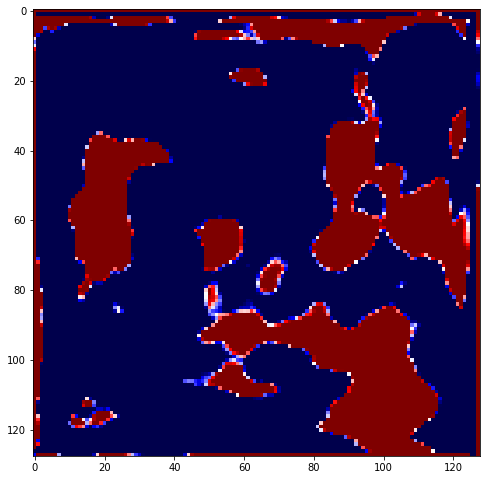

In [22]:
plt.imshow(opt[3,:,:,0], cmap='seismic');

In [16]:
subs = 'random_normal'
res = [i for i in tensor_names if subs in i]
for i in tensor_names:
    print(i)

global_step_128/Initializer/zeros:0
global_step_128:0
global_step_128/Assign:0
global_step_128/read:0
Const:0
train_trans_images_per_res:0
mul/x:0
mul:0
LessEqual:0
cond/Switch:0
cond/Switch:1
cond/switch_t:0
cond/switch_f:0
cond/pred_id:0
cond/sub/Switch:0
cond/sub/Switch:1
cond/sub/Switch_1:0
cond/sub/Switch_1:1
cond/sub:0
cond/truediv:0
cond/Switch_1:0
cond/Switch_1:1
cond/Merge:0
cond/Merge:1
alpha_128/Initializer/ones:0
alpha_128:0
alpha_128/Assign:0
alpha_128/read:0
Assign:0
filenames:0
record_bytes:0
header_bytes:0
footer_bytes:0
buffer_size:0
compression_type:0
num_parallel_calls:0
count:0
buffer_size_1:0
seed:0
seed2:0
batch_size:0
drop_remainder:0
buffer_size_2:0
Const_1:0
buffer_size_3:0
OneShotIterator:0
IteratorToStringHandle:0
IteratorGetNext:0
Reshape/shape:0
Reshape:0
random_normal/shape:0
random_normal/mean:0
random_normal/stddev:0
random_normal/RandomStandardNormal:0
random_normal/mul:0
random_normal:0
ExponentialDecay/learning_rate:0
ExponentialDecay/Cast/x:0
Exponen

ValueError: The name 'generator/g_synthesis/128x128_1/ToRGB/add' refers to an Operation, not a Tensor. Tensor names must be of the form "<op_name>:<output_index>".

In [ ]:
for op in tf.get_default_graph().get_operations():
    print(str(op.name))

global_step_128/Initializer/zeros
global_step_128
global_step_128/Assign
global_step_128/read
Const
train_trans_images_per_res
mul/x
mul
LessEqual
cond/Switch
cond/switch_t
cond/switch_f
cond/pred_id
cond/sub/Switch
cond/sub/Switch_1
cond/sub
cond/truediv
cond/Switch_1
cond/Merge
alpha_128/Initializer/ones
alpha_128
alpha_128/Assign
alpha_128/read
Assign
filenames
record_bytes
header_bytes
footer_bytes
buffer_size
compression_type
num_parallel_calls
count
buffer_size_1
seed
seed2
batch_size
drop_remainder
buffer_size_2
Const_1
buffer_size_3
OneShotIterator
IteratorToStringHandle
IteratorGetNext
Reshape/shape
Reshape
random_normal/shape
random_normal/mean
random_normal/stddev
random_normal/RandomStandardNormal
random_normal/mul
random_normal
ExponentialDecay/learning_rate
ExponentialDecay/Cast/x
ExponentialDecay/Cast
ExponentialDecay/Cast_1/x
ExponentialDecay/truediv
ExponentialDecay/Floor
ExponentialDecay/Pow
ExponentialDecay
generator/w_avg/Initializer/zeros
generator/w_avg
generator/